In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from os import listdir
from os.path import isfile,join
from math import log10, sqrt
import sys
import logging
from itertools import count, combinations
import numpy as np
from maxflow.fastmin import aexpansion_grid_step, abswap_grid_step
logger = logging.getLogger(__name__)
path = ('./images')
filename = [f for f in listdir(path) if isfile(join(path,f))]
TRAIN_PATH = './train/'
TEST_PATH = './test/'


In [10]:
filename

['959675.jpg',
 '959676.jpg',
 '959677.jpg',
 '959678.jpg',
 '959679.jpg',
 '959684.jpg',
 '959685.jpg',
 '959686.jpg',
 '959687.jpg',
 '959688.jpg',
 '959689.jpg',
 '959690.jpg',
 '959691.jpg',
 '959692.jpg',
 '959693.jpg',
 '959696.jpg',
 '959697.jpg',
 '959699.jpg',
 '959700.jpg',
 '959701.jpg',
 '959702.jpg',
 '959703.jpg',
 '959704.jpg',
 '959705.jpg',
 '959706.jpg',
 '959708.jpg',
 '959709.jpg',
 '959711.jpg',
 '959713.jpg',
 '959714.jpg',
 '959715.jpg',
 '959718.jpg',
 '959719.jpg',
 '959721.jpg',
 '959722.jpg',
 '959723.jpg',
 '959726.jpg',
 '959727.jpg',
 '959728.jpg',
 '959729.jpg',
 '959730.jpg',
 '959731.jpg',
 '959732.jpg',
 '959733.jpg',
 '959734.jpg',
 '959735.jpg',
 '959736.jpg',
 '959737.jpg',
 '959738.jpg',
 '959739.jpg',
 '959740.jpg',
 '959741.jpg',
 '959742.jpg',
 '959743.jpg',
 '959744.jpg',
 '959745.jpg',
 '959746.jpg',
 '959747.jpg',
 '959749.jpg',
 '959750.jpg',
 '959752.jpg',
 '959754.jpg',
 '959755.jpg',
 '959757.jpg',
 '959759.jpg',
 '959760.jpg',
 '959761.j

In [3]:
filename[0][-3:]

'png'

In [11]:
# Read only scans
X = []
for f in filename:
    p=path+'/'+f
    X.append(cv2.imread(p))

    

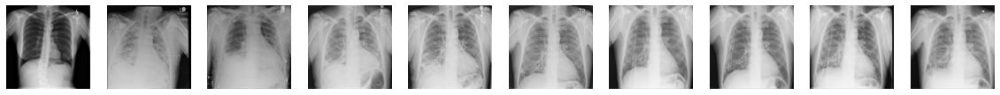

In [16]:
plt.figure(figsize=(20,10))

for i in range(1,len(x)+1):
    plt.subplot(1, 10, i)
    img = x[int(i-1)]
    plt.imshow(img)

    plt.axis('off')

In [12]:
len(x)

10

In [13]:
# Show scans 
for i in range(20):
#     cv2.imshow(str(i+1),x[i])
#     cv2.waitKey()
#     cv2.destroyAllWindows()
    print(X[i].shape)

(1148, 2563, 3)
(1163, 1165, 3)
(1161, 1170, 3)
(1165, 1165, 3)
(1161, 1166, 3)
(411, 477, 3)
(500, 508, 3)
(362, 439, 3)
(362, 445, 3)
(391, 436, 3)
(391, 439, 3)
(1403, 1696, 3)
(1482, 1989, 3)
(3480, 4248, 3)
(1447, 1884, 3)
(2336, 2836, 3)
(1326, 1384, 3)
(1285, 1992, 3)
(1479, 1793, 3)
(1243, 1249, 3)


In [6]:
i=0

## Seed Mask generation

In [16]:
import skimage
filename_im = [f for f in listdir(TRAIN_PATH+'images/') if isfile(join(TRAIN_PATH+'images/',f))]
filename_ms = [f for f in listdir(TRAIN_PATH+'masks/') if isfile(join(TRAIN_PATH+'masks/',f))]

skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


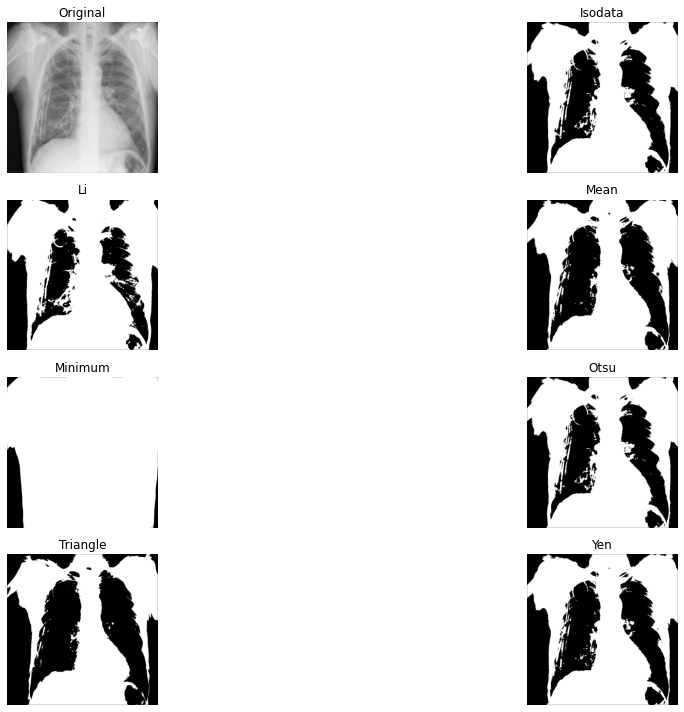

In [148]:
g = cv2.cvtColor(x[7],cv2.COLOR_BGR2GRAY)
result = skimage.filters.thresholding.try_all_threshold(g,figsize=(20,10))

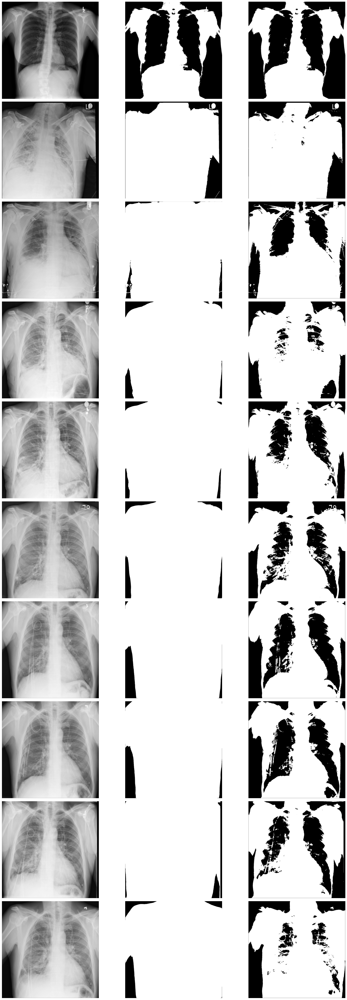

In [149]:
plt.figure(figsize=(20,50))
j=0
i=0
min_erod=[]
# Iterate and plot
while True:
    i+=1
    j+=1
    plt.subplot(10, 3, j)
    img = x[int(i-1)]
    img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.imshow(img, cmap='gray')
#     img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.axis('off')
    
    j+=1
    plt.subplot(10, 3, j)
    mini = cv2.threshold(img,skimage.filters.threshold_minimum(img),255,cv2.THRESH_BINARY)
    plt.imshow(mini[1], cmap='gray')
    min_erod.append(mini[1])
#     img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.axis('off')
#     cv2.imshow(str(i+1),img)
    
    j+=1
#     j = i - 0
    plt.subplot(10, 3, j)
    img = x[int(i-1)]
    img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ots = cv2.threshold(img,skimage.filters.threshold_otsu(img),255,cv2.THRESH_BINARY)
    plt.imshow(ots[1], cmap='gray')
#     img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.axis('off')
    
   
    
    if j+1>30:
        break
    
plt.tight_layout()
# plt.savefig('images+hists.jpg')

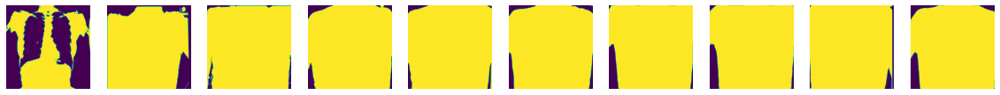

In [672]:
plt.figure(figsize=(20,10))

for i in range(1,len(X)+1):
    plt.subplot(1, 10, i)
    img = min_erod[int(i-1)]
    
    plt.imshow(img)

    plt.axis('off')

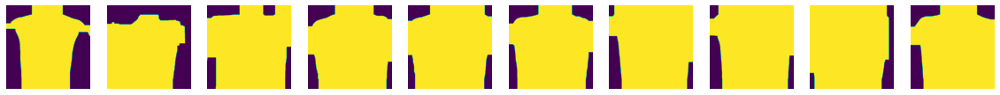

In [153]:
plt.figure(figsize=(20,10))

for i in range(1,len(x)+1):
    plt.subplot(1, 10, i)
    img = eroded[int(i-1)]
    
    plt.imshow(img)

    plt.axis('off')

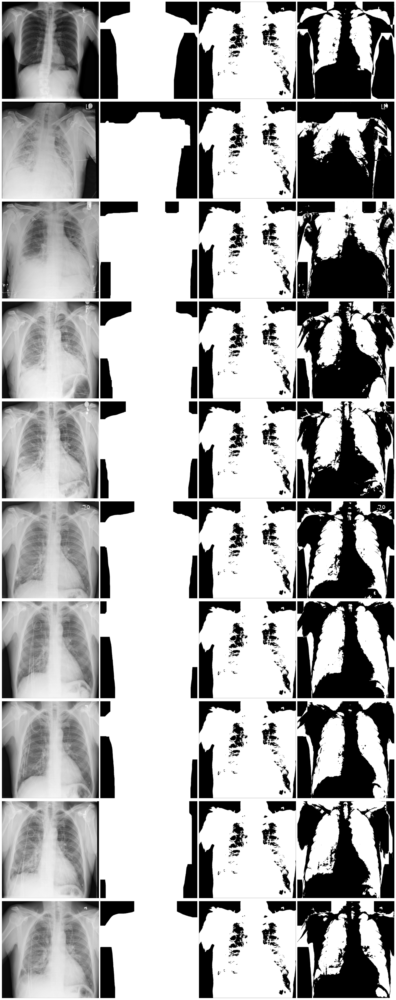

In [155]:
plt.figure(figsize=(20,50))
j=0
i=0

# Iterate and plot
while True:
    i+=1
    j+=1
    plt.subplot(10, 4, j)
    img = x[int(i-1)]
    img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.imshow(img, cmap='gray')
#     img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.axis('off')
    
    j+=1
    plt.subplot(10, 4, j)
    s1 = eroded[int(i-1)]
    plt.imshow(s1, cmap='gray')

    plt.axis('off')
#     cv2.imshow(str(i+1),img)
    
    j+=1
#     j = i - 0
    plt.subplot(10, 4, j)
    s2 = otsu_thresh[int(i-1)]
    plt.imshow(s2, cmap='gray')

#     img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.axis('off')
    
    j+=1
    plt.subplot(10, 4, j)
    img = cv2.bitwise_xor(s1,s2,mask=None)
    plt.imshow(img, cmap='gray')

    plt.axis('off')
    
    if j+1>40:
        break
    
plt.tight_layout()
# plt.savefig('images+hists.jpg')

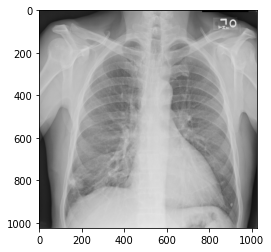

In [1293]:
plt.imshow(X[5],cmap='gray')

In [228]:
vertices = np.array([[230,0],[850,0],[1024,950],[0,950]],np.int32)

In [229]:
pts = vertices.reshape((-1,1,2))

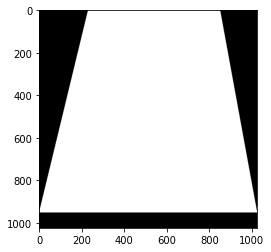

In [247]:

cv2.fillPoly(mask,[pts],(255,255,255))
plt.imshow(mask,cmap='gray')


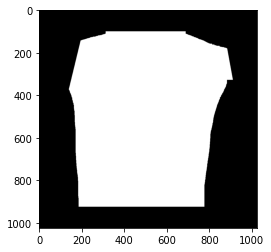

In [248]:
img = eroded[int(i-1)]
a = img.copy()
a= a*mask
plt.imshow(a,cmap='gray')

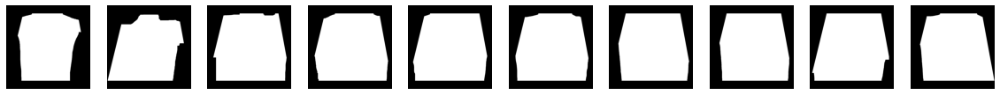

In [250]:
plt.figure(figsize=(20,10))

for i in range(1,len(X)+1):
    plt.subplot(1, 10, i)
    img = eroded[int(i-1)]
    a = img.copy()
#     a= a*mask
#     eroded[int(i-1)] = a
    plt.imshow(a,cmap='gray')

    plt.axis('off')


In [262]:
xor_seeds = []

## Edges with outliers

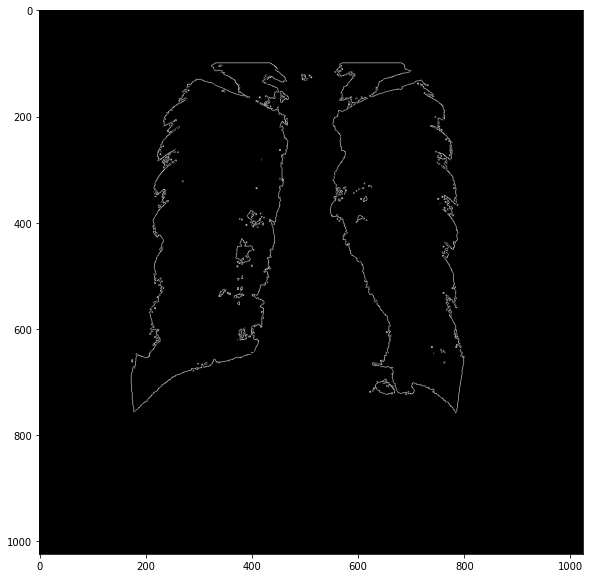

In [1287]:

plt.figure(figsize=(10,10))
img = edges[0]


plt.imshow(img,cmap='gray')


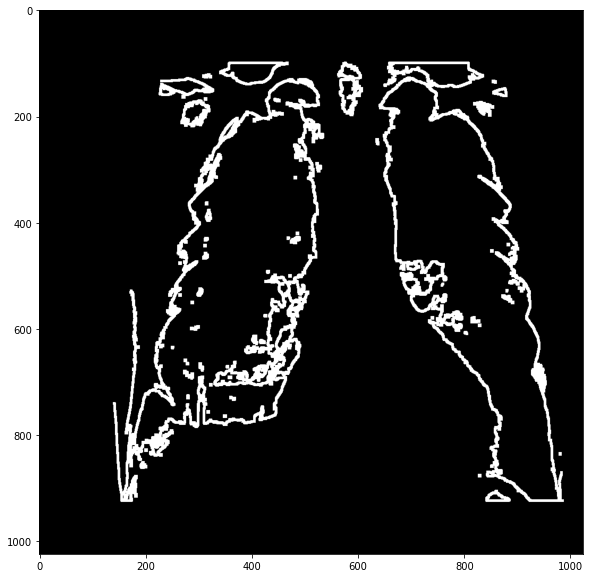

In [1290]:
ker = np.ones((3,3),np.uint8)
ker1s = np.ones((3,3),np.uint8)

plt.figure(figsize=(10,10))
img = edges[9]
img =img*mask
img = cv2.morphologyEx(img,cv2.MORPH_DILATE,ker,iterations=2)
# img = cv2.morphologyEx(img,cv2.MORPH_ERODE,ker1s,iterations=1)

plt.imshow(img,cmap='gray')


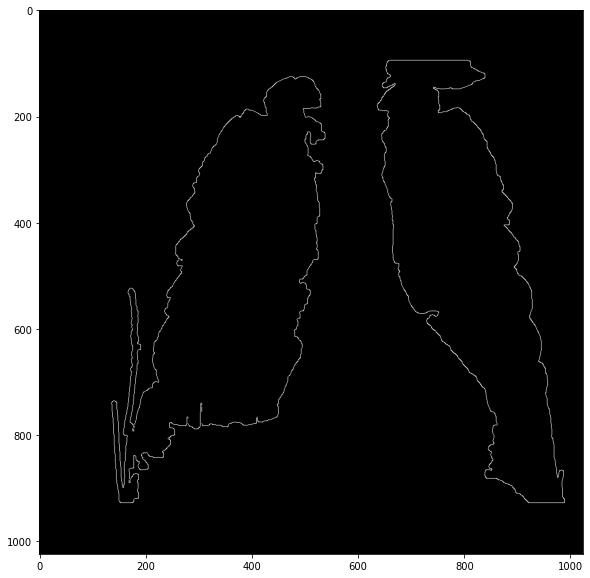

In [1291]:
plt.figure(figsize=(10,10))


image_contours = np.zeros((img.shape[1], img.shape[0], 1), np.uint8)

image_binary = np.zeros((img.shape[1], img.shape[0], 1), np.uint8)
contours = []
   
contours = cv2.findContours(img, 1, 1)[0]   
cv2.drawContours(image_contours, contours, -1, (255,255,255), 3)


contours = cv2.findContours(image_contours, cv2.RETR_LIST,
                           cv2.CHAIN_APPROX_SIMPLE)[0]

q=cv2.drawContours(image_binary, [max(contours, key = cv2.contourArea)],
                -1, (255, 255, 255), -1)

w = cv2.morphologyEx(w,cv2.MORPH_DILATE,kernels,iterations = 2)
w = q.reshape((1024,1024))
w = 255-w
sec=img*w
# sec=img
cn = np.zeros((img.shape[1], img.shape[0], 1), np.uint8)
bi = np.zeros((img.shape[1], img.shape[0], 1), np.uint8)

contours = cv2.findContours(sec, 1, 1)[0]   
cv2.drawContours(cn, contours, -1, (255,255,255), 3)


contours = cv2.findContours(cn, cv2.RETR_LIST,
                           cv2.CHAIN_APPROX_SIMPLE)[0]

Q=cv2.drawContours(bi, [max(contours, key = cv2.contourArea)],
                -1, (255, 255, 255), -1)
Q = cv2.Canny(Q,0,255,apertureSize=5,L2gradient=True)
q = auto_canny(q)
final = Q+q
plt.imshow(final,cmap='gray')

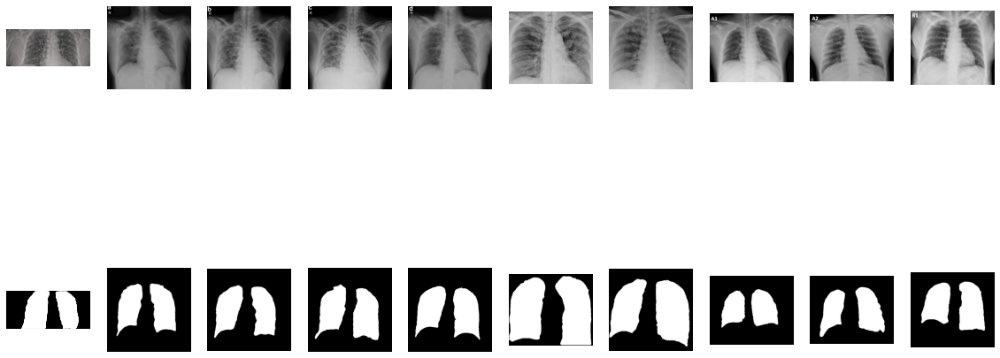

In [18]:
# Read only scans
X_i = []
Y_i=[]
for f in filename_im:
    p=TRAIN_PATH+'images/'+f
    q=TRAIN_PATH+'masks/'+f
    X_i.append(cv2.imread(p))
    Y_i.append(cv2.imread(q))

plt.figure(figsize=(20,10))

for i in range(1,11):
    plt.subplot(2, 10, i)
    img = X_i[int(i-1)]    
    plt.imshow(img)
    plt.axis('off')
for i in range(11,21):
    plt.subplot(2, 10, i)
    img = Y_i[int(i-11)]    
    plt.imshow(img)
    plt.axis('off')

#### MASK USED

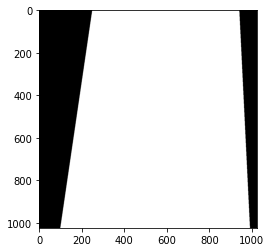

In [908]:

mask = np.zeros([1024,1024],np.uint8)
vertices = np.array([[250,0],[940,0],[990,1024],[100,1024]],np.int32)
pts = vertices.reshape((-1,1,2))
cv2.fillPoly(mask,[pts],(255,255,255))
plt.imshow(mask,cmap='gray')


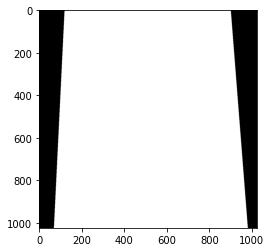

In [902]:

mask1 = np.zeros([1024,1024],np.uint8)
vertices = np.array([[120,0],[900,0],[980,1024],[70,1024]],np.int32)
pts = vertices.reshape((-1,1,2))
cv2.fillPoly(mask1,[pts],(255,255,255))
plt.imshow(mask1,cmap='gray')


In [1098]:
for i in range(10):
#     cv2.imwrite('./edges_of_seeds/'+str(i+1)+'.jpg', edge_from_seeds[i])
#     cv2.imwrite('./seed_masks/'+str(i+1)+'.jpg', seeds_final[i])
#     cv2.imwrite('./edge_maps/'+str(i+1)+'.jpg', edges_final[i])

In [1036]:
sd = seeds_final[0].reshape((1024,1024))
sd.shape

(1024, 1024)

## PART 1

### HISTOGRAMS + EQN

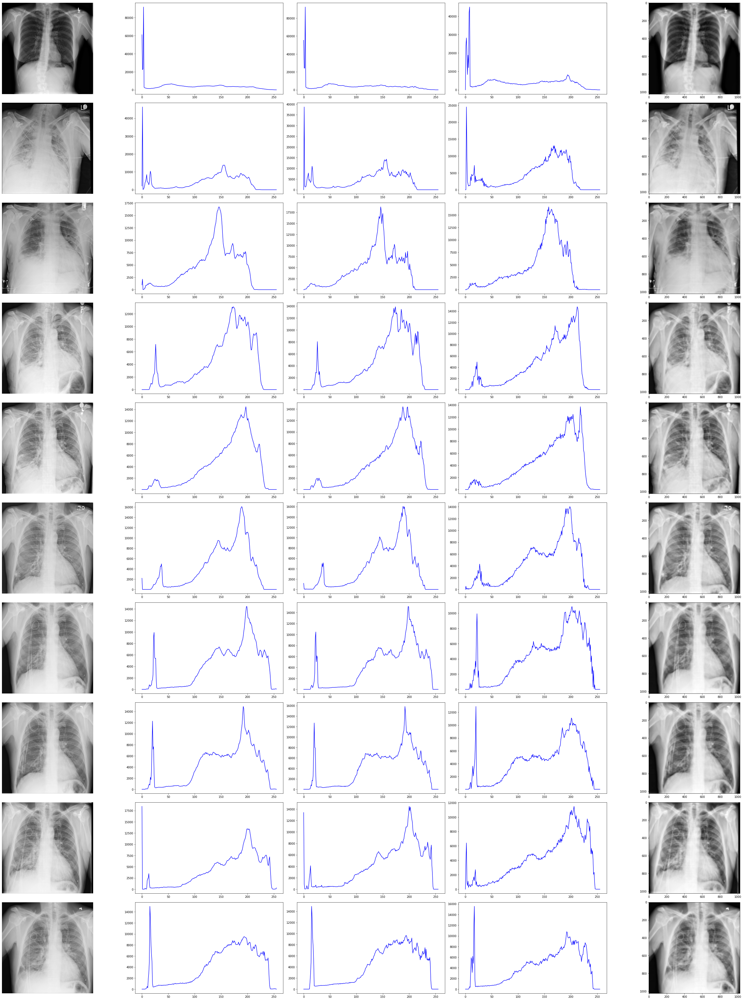

In [1264]:
plt.figure(figsize=(40,50))
j=0
i=0
y=[]
# Iterate and plot
while True:
    i+=1
    j+=1
    plt.subplot(10, 5, j)
    img = X[int(i-1)]
    img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.imshow(img, cmap='gray')
#     img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.axis('off')
#     cv2.imshow(str(i+1),img)
    
    j+=1
#     j = i - 0
    plt.subplot(10, 5, j)
    h = cv2.calcHist([img],[0],None,[256],[0,256])
    plt.plot(h,color='b')
    
    j+=1
#     j = i - 0
    plt.subplot(10, 5, j)
    img = cv2.bilateralFilter(img,10, 110, 110, cv2.BORDER_DEFAULT)
    h = cv2.calcHist([img],[0],None,[256],[0,256])
    plt.plot(h,color='b')
    
    j+=1
#     j = i - 0
    plt.subplot(10, 5, j)
    img = cv2.bilateralFilter(img,10, 110, 110, cv2.BORDER_DEFAULT)
    clahe = cv2.createCLAHE(clipLimit=1, tileGridSize=(8,8))
    img = clahe.apply(img)
    h = cv2.calcHist([img],[0],None,[256],[0,256])
    plt.plot(h,color='b')
    
    j+=1
#     j=i-0
    plt.subplot(10, 5, j)
    plt.imshow(img,cmap='gray')
    y.append(img)
    if j+1>50:
        break
    
plt.tight_layout()
# plt.savefig('images+hists.jpg')

In [1266]:
for i in range(10):
    print(f" {PSNR(cv2.cvtColor(X[i],cv2.COLOR_BGR2GRAY),y[i]): 6f} ")

  29.927844 
  30.227894 
  30.148512 
  30.763614 
  30.075971 
  29.869903 
  30.471523 
  30.443774 
  30.016479 
  30.723674 


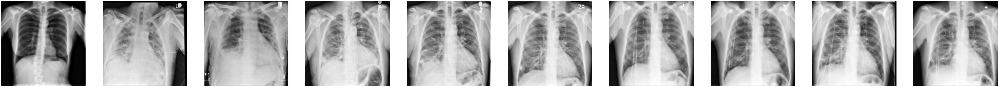

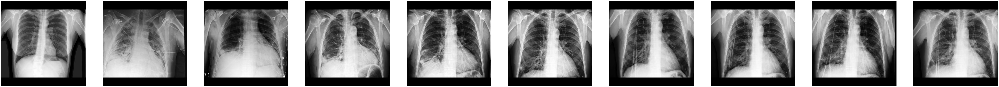

<Figure size 432x288 with 0 Axes>

In [1285]:
plt.figure(figsize=(100,30))
j=0
i=0
# y1=[]
# Iterate and plot
while True:
    i+=1
    j+=1
    plt.subplot(1, 10, j)
    img = y[int(i-1)]
#     img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.imshow(img, cmap='gray')
#     img = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    plt.axis('off')
#     cv2.imshow(str(i+1),img)
    if j+1>10:
        plt.show()
        break
plt.figure(figsize=(100,30))

j=0
i=0
while True:
    i+=1
    j+=1
#     j=i-0
    plt.subplot(1, 10, j)
    plt.imshow(equalised[i-1],cmap='gray')
    plt.axis('off')
#     y1.append(equalised[i-1])
    if j+1>10:
        plt.show()
        break
    
plt.tight_layout()
# plt.savefig('images+hists.jpg')

In [1283]:
for i in range(5):
    print(f" {PSNR(cv2.cvtColor(X[i+2],cv2.COLOR_BGR2GRAY),y1[i]) + 10: 6f} ")

  37.909849 
  37.910059 
  37.873035 
  37.762828 
  37.860376 


In [1261]:
#Prominently Gaussian and Speckle Noise
#PSNR for future calculation
def PSNR(original, compressed): 
    mse = np.mean((original - compressed) ** 2) 
    if(mse == 0):  # MSE is zero means no noise is present in the signal . 
                  # Therefore PSNR have no importance. 
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse)) 
    return psnr 